## Семинар 12. Механизм `HIPPO`. Модели пространства состояний `Space State Models`. Модель `Mamba`

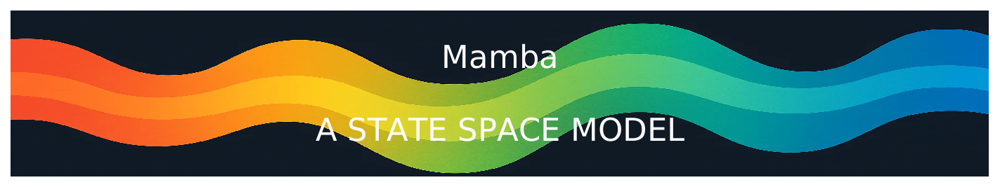


In [1]:
import matplotlib.pyplot    as plt
import torch.nn             as nn
import plotly.graph_objects as go
import numpy                as np
import scipy                as sp
import torch.nn.functional  as F

import seaborn              as sns

import os
os.environ['JAX_PLATFORM_NAME'] = 'cpu'

import jax.numpy            as jnp
import jax

from numpy.polynomial import legendre as L
from plotly.subplots  import make_subplots
from functools        import partial
from jax.numpy.linalg import inv

from matplotlib.animation import FuncAnimation

# Use 'notebook' instead for interactive plots
%matplotlib inline
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('retina')

import seaborn as sns

sns.set(rc={
#    "figure.dpi" :300,
#    'savefig.dpi':300,
    'animation.html':'jshtml',
    'animation.embed_limit':100, # Max animation size in Mb
})

sns.set_context('notebook')
sns.set_style('whitegrid') # or 'ticks'

from scipy import special as ss
from scipy import linalg as la
from scipy import signal

from torch.utils.data import Dataset, DataLoader
from einops           import rearrange, repeat, reduce

import torch
import nengo
import math
import sys

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
np.random.seed(0)

## Механизм `HIPPO`

Воспользуемся возможностями библиотеки `Nengo` сгенерируем синтетический набор данных - белый шум, ограниченный по частоте. Сигнал имеет длину `period / dt` и максимальную частоту `freq`.

In [2]:
def whitesignal(period, dt, freq, rms=0.5, batch_shape=()):
    """
    Nengo-based version of the custom WhiteSignal generator.
    Generates band-limited white noise with a frequency cutoff in Hz.

    Returns:
        ndarray of shape (*batch_shape, int(period/dt))
    """

    # --- SAFETY CHECKS (preserve your original logic) ---
    if freq is not None and freq < 1.0 / period:
        raise ValueError(f"`freq` must satisfy freq >= 1/period = {1/period}")

    nyquist_cutoff = 0.5 / dt
    if freq > nyquist_cutoff:
        raise ValueError(
            f"{freq} Hz exceeds Nyquist frequency ({nyquist_cutoff:.3f} Hz)"
        )
    # Create the Nengo white-signal generator
    process = nengo.processes.WhiteSignal(
        period=period,
        high=freq,         
        rms=rms,           # RMS amplitude
    )

    # Number of discrete samples
    n_steps = int(np.ceil(period / dt))

    # --- No batch: return single signal ---
    if batch_shape == ():
        sig = process.run(period, dt=dt)
        # Ensure exact length
        sig = sig[:n_steps]
        return sig.astype(np.float32)[:,0]

    # --- Batched version ---
    result = np.zeros(batch_shape + (n_steps,), dtype=np.float32)

    for idx in np.ndindex(batch_shape):
        sig = process.run(period, dt=dt)
        result[idx] = sig[:n_steps]

    return result


In [3]:
# ---------------------------------------------------------------------
# Параметры сигнала
# ---------------------------------------------------------------------
period = 1.0     # 1 секунда
dt     = 0.001   # дискретизация 1 kHz
freq   = 10.0    # ограничение спектра до 10 Hz

# Генерация
y_s = whitesignal(period, dt, freq)
t = np.linspace(0, period, y_s.shape[-1])

# Спектр
freqs   = np.fft.rfftfreq(len(y_s), d=dt)
fft_mag = np.abs(np.fft.rfft(y_s))

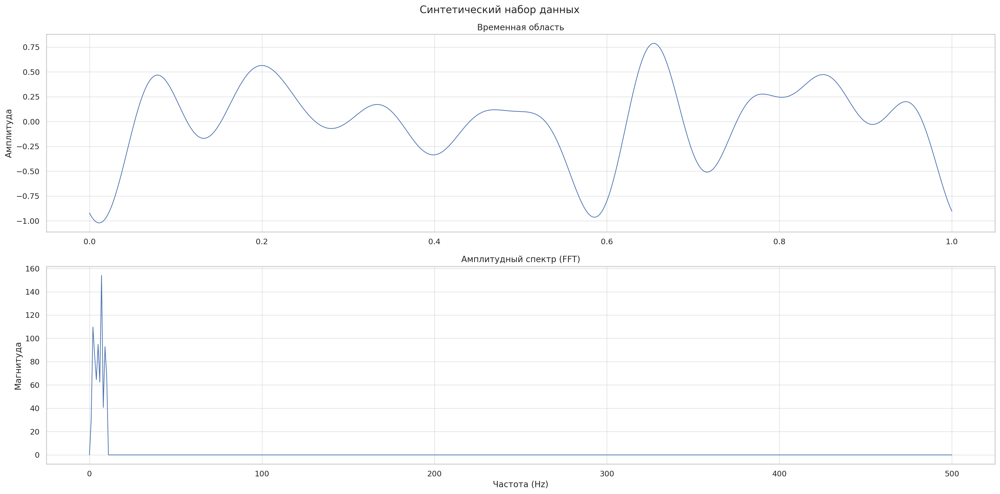

In [4]:
# ---------------------------------------------------------------------
# Визуализация matplotlib
# ---------------------------------------------------------------------
fig, axes = plt.subplots(2, 1, figsize=(20, 10), sharex=False)
# ------------------- Временная область -------------------
axes[0].plot(t, y_s, linewidth=1.0)
axes[0].set_title("Временная область")
axes[0].set_ylabel("Амплитуда"       )
axes[0].grid(True, alpha=0.5)
# ------------------- Амплитудный спектр -------------------
axes[1].plot(freqs, fft_mag, linewidth=1.0)
axes[1].set_title("Амплитудный спектр (FFT)")
axes[1].set_xlabel("Частота (Hz)"           )
axes[1].set_ylabel("Магнитуда"              )
axes[1].grid(True, alpha=0.5)

fig.suptitle("Cинтетический набор данных")
plt.tight_layout()
plt.show()

Реализуем функцию `basis`, функция строит матрицу значений ортонормированных полиномов Лежандра, используемых в механизме `HiPPO` для аппроксимации истории входного сигнала и для последующего восстановления функции. 

Пусть заданы моменты времени $ t \in \{t_1, \ldots, t_T\}, $ и фиксирован порядок разложения $N$. Тогда функция вычисляет значения
$$
P_n(t_k), \qquad n = 0,\ldots, N-1,\;\; k = 1,\ldots, T,
$$
где $P_n(\cdot)$ — полиномы Лежандра.

Для обеспечения ортонормированности и корректного отображения полубесконечного временного интервала $t \in [0, \infty)$ в отрезок $[-1, 1]$, используемый в классических полиномах Лежандра, применяется преобразование
$$
x = e^{-t}
$$

In [5]:
def basis(method, N, vals, c=0.0, truncate_measure=True):
    """
    vals: list of times (forward in time)
    returns: shape (T, N) where T is length of vals
    """
    if   method == 'legt':
        eval_matrix = ss.eval_legendre(np.arange(N)[:, None], 2*vals-1).T
        eval_matrix *= (2*np.arange(N)+1)**.5 * (-1)**np.arange(N)
    elif method == 'legs':
        _vals = np.exp(-vals)
        eval_matrix = ss.eval_legendre(np.arange(N)[:, None], 1-2*_vals).T # (L, N)
        eval_matrix *= (2*np.arange(N)+1)**.5 * (-1)**np.arange(N)
    if truncate_measure:
        eval_matrix[measure(method)(vals) == 0.0] = 0.0
    
    p = torch.tensor(eval_matrix)
    p *= np.exp(-c*vals)[:, None] # [::-1, None]
    return p

Реализуем функцию создания матрицы перехода `A` и матрицы входа `B` механизма `HIPPO`

In [6]:
def transition(measure, N, **measure_args):
    # Legendre (translated)
    if measure == 'legt':
        Q = np.arange(N, dtype=np.float64)
        R = (2*Q + 1) ** .5
        j, i = np.meshgrid(Q, Q)
        A = R[:, None] * np.where(i < j, (-1.)**(i-j), 1) * R[None, :]
        B = R[:, None]
        A = -A
    # Legendre (scaled)
    elif measure == 'legs':
        q = np.arange(N, dtype=np.float64)
        col, row = np.meshgrid(q, q)
        r = 2 * q + 1
        M = -(np.where(row >= col, r, 0) - np.diag(q))
        T = np.sqrt(np.diag(2 * q + 1))
        A = T @ M @ np.linalg.inv(T)
        B = np.diag(T)[:, None]
        B = B.copy() # Otherwise "UserWarning: given NumPY array is not writeable..." after torch.as_tensor(B)
    else: raise NotImplementedError
    return A, B


Определим меру (весовую функцию), относительно которой ортонормируются полиномы в `HiPPO`.

In [7]:
def measure(method, c=0.0):
    if method == 'legt':
        fn = lambda x: np.heaviside(x, 0.0) * np.heaviside(1.0-x, 0.0)
    elif method == 'legs':
        fn = lambda x: np.heaviside(x, 1.0) * np.exp(-x)
    else: raise NotImplementedError
    fn_tilted = lambda x: np.exp(c*x) * fn(x)
    return fn_tilted

### HiPPO-LegS

Оператор `HiPPO-LegS` (Legendre Scaled) описывает оптимальное непрерывное обновление коэффициентов разложения входного сигнала в ортонормированном базисе полиномов Лежандра. 
Модель `LegS` вводит масштабно-инвариантную динамику, в которой история входа представляется на полуоси $x \in [0,\infty)$, а новые наблюдения постепенно `вытесняют` старую информацию за счёт нелинейного изменения
масштаба. В результате рекуррентное уравнение имеет вид
$$
\dot{c}(t) = \frac{1}{t}\bigl(A\, c(t) + B\, u(t)\bigr),
$$
где матрицы $A$ и $B$ происходят из ортогональных свойств полиномов Лежандра. Такое масштабирование обеспечивает устойчивое и компактное представление всей прошлой истории, позволяя хранить в фиксированном
размере состояния информацию о входном сигнале на протяжении сколь угодно долгого времени.

Дискретная система `HiPPO` имеет вид:
$$
c_t = A_t^{(d)}c_{t-1} + B_t^{(d)}u_t.
$$

Матрицы $A_t$ и $B_t$ для билинейного метода имеют вид:

$$
A_t^{(d)} =
\left(I - \frac{A}{2t}\right)^{-1}
\left(I + \frac{A}{2t}\right),
\qquad
B_t^{(d)} =
\left(I - \frac{A}{2t}\right)^{-1}\frac{B}{t}.
$$


In [8]:
class HiPPO_LegS(nn.Module):
    """ Vanilla HiPPO-LegS model (scale invariant instead of time invariant) """
    def __init__(self, N, max_length=1024):
        """
        max_length: maximum sequence length
        """
        super().__init__()
        self.N = N
        A, B = transition('legs', N)
        B = B.squeeze(-1)
        A_stacked = np.empty((max_length, N, N), dtype=A.dtype)
        B_stacked = np.empty((max_length, N), dtype=B.dtype)
        for t in range(1, max_length + 1):
            At, Bt = A / t, B / t
            
            A_stacked[t - 1] = la.solve_triangular(np.eye(N) - At / 2, np.eye(N) + At / 2, lower=True)
            B_stacked[t - 1] = la.solve_triangular(np.eye(N) - At / 2, Bt, lower=True)
        self.register_buffer('A_stacked', torch.Tensor(A_stacked)) # (max_length, N, N)
        self.register_buffer('B_stacked', torch.Tensor(B_stacked)) # (max_length, N   )

        vals = np.linspace(0.0, 1.0, max_length)
        self.eval_matrix = torch.Tensor((B[:, None] * ss.eval_legendre(np.arange(N)[:, None], 2 * vals - 1)).T  )

    def forward(self, inputs, fast=False):
        """
        inputs : (length, ...)
        output : (length, ..., N) where N is the order of the HiPPO projection
        """
        L = inputs.shape[0]

        inputs = inputs.unsqueeze(-1)
        u = torch.transpose(inputs, 0, -2)
        u = u * self.B_stacked[:L]
        u = torch.transpose(u, 0, -2) # (length, ..., N)

        if fast:
            result = variable_unroll_matrix(self.A_stacked[:L], u)
            return result
        
        c = torch.zeros(u.shape[1:]).to(inputs)
        cs = []
        for t, f in enumerate(inputs):
            c = F.linear(c, self.A_stacked[t]) + self.B_stacked[t] * f
            cs.append(c)
        return torch.stack(cs, dim=0)

    def reconstruct(self, c):
        a = self.eval_matrix.to(c) @ c.unsqueeze(-1)
        return a

### HiPPO-LegT

Оператор `HiPPO-LegT` (Legendre Time-Invariant) формулирует обновление коэффициентов разложения входного сигнала в базисе классических полиномов Лежандра при фиксированной, времени-инвариантной динамике. В отличие от `LegS`, здесь история рассматривается на конечном интервале $x \in [0,1]$, а поступающие значения входа сдвигают это окно во времени. Соответствующее непрерывное рекуррентное уравнение имеет вид
$$
\dot{c}(t) = A\, c(t) + B\, u(t),
$$
где матрицы $A$ и $B$ выводятся из ортогональности полиномов Лежандра на фиксированном интервале. Такая временно-инвариантная формулировка позволяет эффективно сохранять \emph{локальную} историю входного сигнала с высокой
точностью, но в отличие от масштабно-инвариантного `LegS` не обеспечивает естественного механизма для представления крайне далёкого прошлого. Это делает `LegT` удобным для задач, где важна недавняя динамика сигнала и
фиксированная «память» по времени.

Дискретная система имеет стандартный вид
$$
c_t = A^{(d)} c_{t-1} + B^{(d)} u_t,
$$

Для дискретизации модели LegT с шагом $\Delta t$ применяют билинейное
преобразование (метод Тастина), что приводит к следующим дискретным
матрицам:
$$
A^{(d)} =
\left(I - \tfrac{\Delta t}{2} A\right)^{-1}
\left(I + \tfrac{\Delta t}{2} A\right),
\qquad
B^{(d)} =
\left(I - \tfrac{\Delta t}{2} A\right)^{-1}
\left(\Delta t\, B\right).
$$

В отличие от `LegS`, здесь отсутствует масштабирование вида $1/t$, поэтому дискретные операторы $A^{(d)}$ и $B^{(d)}$ остаются постоянными. Это отражает ключевую особенность `LegT`: модель хранит историю на фиксированном временном окне, и её динамика не зависит от текущего временного масштаба.

In [9]:
class HiPPO_LegT(nn.Module):
    """ Linear time invariant x' = Ax + Bu """
    def __init__(self, N, dt=1.0, T=1.0, scale=False, c=0.0):
        """
        N: the order of the HiPPO projection
        dt: discretization step size - should be roughly inverse to the length of the sequence
        """
        super().__init__()
        self.N, self.dt, self.T, self.c = N, dt, T, c
        
        A, B = transition('legt', N)
        A = A + np.eye(N)*c
        self.A, self.B = A, B.squeeze(-1)
        
        self.measure_fn = measure('legt')
        
        C = np.ones ((1, N))
        D = np.zeros((1,  ))
        dA, dB, _, _, _ = signal.cont2discrete((A, B, C, D), dt=dt, method='bilinear')
        
        dB = dB.squeeze(-1)

        self.register_buffer('dA', torch.Tensor(dA)) # (N, N)
        self.register_buffer('dB', torch.Tensor(dB)) # (N,)

        self.vals = np.arange(0.0, T, dt)
        self.eval_matrix = basis('legt', self.N, self.vals, c=self.c) # (T/dt, N)
        self.measure     = measure('legt')(self.vals)
    
    def forward(self, inputs, fast=True):
        """
        inputs : (length, ...)
        output : (length, ..., N) where N is the order of the HiPPO projection
        """

        inputs = inputs.unsqueeze(-1)
        u = inputs * self.dB # (length, ..., N)

        c = torch.zeros(u.shape[1:]).to(inputs)
        cs = []
        for f in inputs:
            c = F.linear(c, self.dA) + self.dB * f
            cs.append(c)
        return torch.stack(cs, dim=0)
    
    def reconstruct(self, c, evals=None): # TODO take in a times array for reconstruction
        """
        c: (..., N,) HiPPO coefficients (same as x(t) in S4 notation)
        output: (..., L,)
        """
        if evals is not None:
            eval_matrix = basis('legt', self.N, evals)
        else:
            eval_matrix = self.eval_matrix

        m = self.measure[self.measure != 0.0]

        c = c.unsqueeze(-1)
        y = eval_matrix.to(c) @ c
        return y.squeeze(-1).flip(-1)

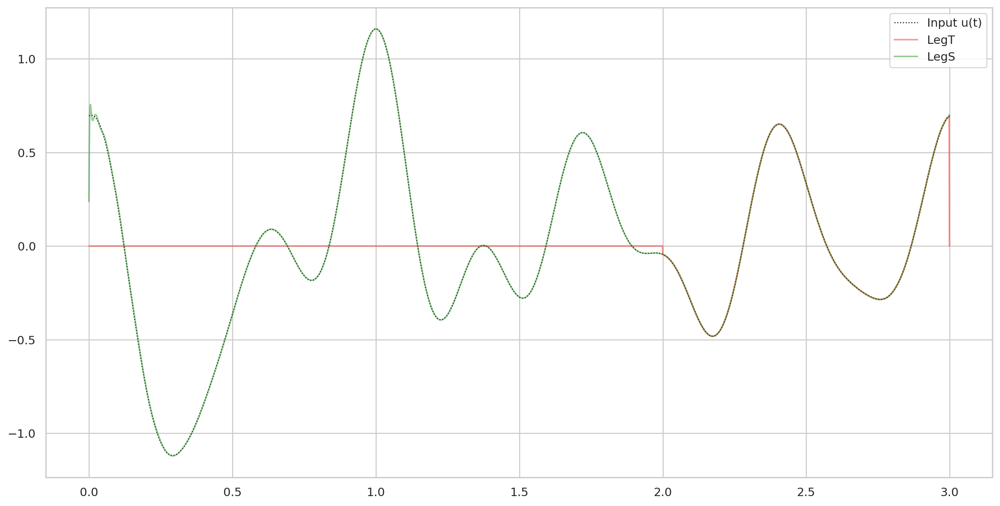

In [10]:
def plot(T, dt, N, freq):
    vals = np.arange(0.0, T, dt)
    
    u = whitesignal(T, dt, freq=freq)
    u = torch.tensor(u, dtype=torch.float)
    u = u.to(device)

    plt.figure(figsize=(16, 8))
    offset = 0.0
    plt.plot(vals, u.cpu()+offset, 'k', linewidth=1.0, label='Input u(t)', linestyle=':')
    
    # Linear Time Invariant (LTI) methods x' = Ax + Bu
    hippo = HiPPO_LegT(N=N, dt=dt, T=T).to(device)
    u_hippo = hippo.reconstruct(hippo(u))[-1].cpu()
    plt.plot(vals[-len(u_hippo):], u_hippo, label='LegT', alpha=0.4, color='red')
        
    hippo = HiPPO_LegS(N=N, max_length=int(T/dt)).to(device)
    u_hippo = hippo.reconstruct(hippo(u))[-1].cpu()
    plt.plot(vals[-len(u_hippo):], u_hippo, label='LegS', alpha=0.4, color='green')
    
    plt.legend()
    plt.show()
    plt.close()


plot(T=3, dt=1e-3, N=64, freq=3.0)

Модели `HiPPO` существуют в двух ключевых формулировках `LegT` и `LegS`, которые различаются тем, как трактуют время и структуру памяти. 
В варианте `LegT` система является линейной и стационарной: динамика задаётся уравнением 
$$
x'(t) = A x(t) + B u(t),
$$
где матрицы $A$ и $B$ не зависят от времени. Такое представление аппроксимирует историю входа в `абсолютном времени`, 
и коэффициенты разложения напрямую отражают фактическую длину временного окна. Напротив, формулировка `LegS` использует масштаб-инвариантную динамику
$$
x'(t) = \frac{1}{t} A x(t) + \frac{1}{t} B u(t),
$$
при которой вся прошлая история нормируется к единичному интервалу. Ранние события `сжимаются` сильнее, а поздние --- слабее, что обеспечивает 
устойчивое кодирование очень длинных последовательностей независимо от их  абсолютной длительности. Таким образом, `LegT` описывает память в фиксированной 
временной шкале, тогда как `LegS` --- в нормализованной, что приводит к  существенно различным свойствам при работе с долго текущими процессами.

In [11]:
sns.set_style('ticks')

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def plt_lines(x, y, color, size, label=None):
    return plt.plot(x, y, color, linewidth=size, label=label)[0]

def update_lines(ln, x, y):
    ln.set_data(x, y)

def animate_hippo(
    T=5, dt=5e-4, N=64, freq=20.0,
    interval=100,
    plot_hippo=False, hippo_offset=0.0, label_hippo=False,
    plot_measure=False, measure_offset=-3.0, label_measure=False,
    plot_coeff=None, coeff_offset=3.0,
    plot_s4=False, s4_offset=6.0,
    plot_hippo_type='line', plot_measure_type='line', plot_coeff_type='line',
    size=1.0,
    plot_legend=True, plot_xticks=True, plot_box=True,
    plot_vline=False,
    animate_u=False,
    seed=2,
):
    np.random.seed(seed)

    vals = np.arange(0, int(T/dt)+1)
    L = int(T/dt)+1

    u = torch.FloatTensor(whitesignal(T, dt, freq=freq))
    u = F.pad(u, (1, 0))
    u = u + torch.FloatTensor(np.sin(1.5*np.pi/T*np.arange(0, T+dt, dt))) # add 3/4 of a sin cycle
    u = u.to(device)

    hippo = HiPPO_LegT(N=N, dt=dt, T=T).to(device)
    coef_hippo = hippo(u).cpu().numpy()
    h_hippo = hippo.reconstruct(hippo(u)).cpu().numpy()
    u = u.cpu().numpy()

    fig, ax = plt.subplots(figsize=(12, 4))
    
    if animate_u:
        ln_u = plt_lines([], [], 'k', size, label='Input $u(t)$')
    else:
        plt_lines(vals, u, 'k', size, label='Input $u(t)$')
    
    if plot_hippo:
        label_args = {'label': 'HiPPO reconstruction'} if label_hippo else {}
        ln = plt_lines([], [], size=size, color='red', **label_args)

    if plot_measure:
        label_args = {'label': 'HiPPO Measure'} if label_measure else {}
        ln_measure = plt_lines(vals, np.zeros(len(vals))+measure_offset, size=size, color='green', **label_args)

    if plot_coeff is None: plot_coeff = []
    if isinstance(plot_coeff, int): plot_coeff = [plot_coeff]
    if len(plot_coeff) > 0:
        ln_coeffs = [
            plt_lines([], [], size=size, color='blue')
            for _ in plot_coeff
        ]
        plt_lines([], [], size=size, color='blue', label='State $x(t)$') # For the legend
        
    
    ### Y AXIS LIMITS
    if plot_measure:
        min_y = measure_offset
    else:
        min_y = np.min(u)
        
    if len(plot_coeff) > 0:
        max_u = np.max(u) + coeff_offset
    else:
        max_u = np.max(u)


    C = np.random.random(N)
    s4 = np.sum(coef_hippo * C, axis=-1)
    max_s4 = 0.0
    if plot_s4:
        ln_s4 = plt_lines([], [], size=size, color='red', label='Output $y(t)$')
        max_s4 = np.max(s4)+s4_offset
    
    if plot_vline:
        ln_vline = ax.axvline(0, ls='-', color='k', lw=1)

    if plot_legend:
        plt.legend(loc='upper left', fontsize='x-small')


    def init():
        left_endpoint = vals[0]
        ax.set_xlim(left_endpoint, vals[-1]+1)
        ax.set_ylim(min_y, max(max_u, max_s4))
        ax.set_yticks([])
        if not plot_xticks: ax.set_xticks([])
        if not plot_box: plt.box(False)
        return [] # ln,

    def update(frame):
        if animate_u:
            xdata = np.arange(frame)
            ydata = u[:frame]
            update_lines(ln_u, xdata, ydata)

        m = np.zeros(len(vals))
        m[:frame] = hippo.measure_fn(np.arange(frame)*dt)[::-1]
        xdata = vals
        if plot_measure:
            update_lines(ln_measure, xdata, m+measure_offset)
        
        if plot_hippo:   
            ydata = h_hippo[frame] + hippo_offset
            m2 = hippo.measure_fn(np.arange(len(ydata))*dt)[::-1]
            # Remove reconstruction where measure is 0
            ydata[m2 == 0.0] = np.nan
            xdata = np.arange(frame-len(ydata), frame)
            update_lines(ln, xdata, ydata)

        if len(plot_coeff) > 0:
            for coeff, ln_coeff in zip(plot_coeff, ln_coeffs):
                update_lines(ln_coeff, np.arange(frame), coef_hippo[:frame, coeff] + coeff_offset)
        if plot_s4: # Only scale case; scale case should copy plot_hippo logic
            update_lines(ln_s4, np.arange(0, frame), s4[:frame] + s4_offset)
            
        if plot_vline:
            ln_vline.set_xdata([frame, frame])

        return []

    ani = FuncAnimation(fig, update, frames=np.arange(0, int(T*1000/interval)+1)*int(interval/1000/dt), interval=interval, init_func=init, blit=True)

    return ani

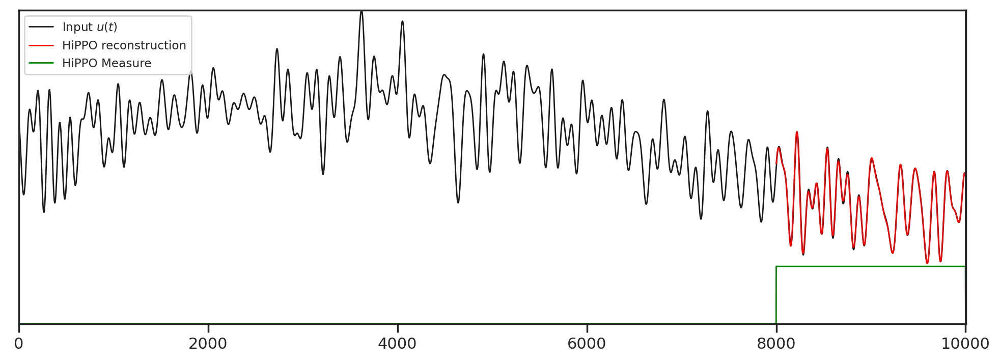

In [12]:
ani = animate_hippo(
    T=5, dt=5e-4, N=64, interval=100, size=1.0,
    animate_u=True,
    plot_hippo=True, hippo_offset=0.0, label_hippo=True,
    plot_s4=False, s4_offset=6.0,
    plot_measure=True, measure_offset=-3.0, label_measure=True,
    plot_coeff=[], coeff_offset=3.0,
    plot_legend=True, plot_xticks=True, plot_box=True,
    plot_vline=True,
)
ani

## Модель пространства состояний `S4`

### Упрощенная версия `S4`

$$
\textbf{Непрерывная SSM:} \qquad
\dot{x}(t) = \Lambda\, x(t) + B\, u(t), 
\qquad 
y(t) = C\, x(t),
$$
где $\Lambda$ — диагональная комплексная матрица.

$$
\textbf{Дискретизация:} \qquad
A = e^{\Lambda \, \Delta t}, \qquad B,\, C \ \text{не изменяются}.
$$

$$
\textbf{Импульсный ответ:} \qquad
h[k] = C \, A^{k} \, B\,.
$$

$$
\textbf{SSM $\rightarrow$ Свертка:} \qquad
y[k] = (h * x)[k] = \sum_{j=0}^{k} h[j]\, x[k-j].
$$

Именно этот механизм преобразует S4 из модели на основе SSM 
в эффективную свёрточную операцию, вычисляемую на GPU.

In [13]:
class S4Layer(nn.Module):
    """Упрощённый S4-подобный слой для одномерной последовательности (SISO)."""
    def __init__(self, N=64, L_max=512, dt=0.25):
        super().__init__()
        self.L_max = L_max
        self.dt    = dt
        self.N     = N
                
        g = torch.Generator().manual_seed(0)

        self.lambda_real = nn.Parameter(-torch.rand (N, generator=g) * 0.5 - 0.1)
        self.lambda_imag = nn.Parameter( torch.rand (N, generator=g) * 2.0 - 1.0)
        self.B_real      = nn.Parameter( torch.randn(N, generator=g) * 0.1)
        self.B_imag      = nn.Parameter( torch.randn(N, generator=g) * 0.1)
        self.C_real      = nn.Parameter( torch.randn(N, generator=g) * 0.1)
        self.C_imag      = nn.Parameter( torch.randn(N, generator=g) * 0.1)
        
        self.register_buffer("kernel", torch.zeros(L_max))

    def _complex_params(self):
        """Восстановление комплексных параметров Λ, B, C."""
        Λ = self.lambda_real + 1j * self.lambda_imag
        B = self.B_real + 1j * self.B_imag
        C = self.C_real + 1j * self.C_imag
        return Λ.to(torch.complex64), B.to(torch.complex64), C.to(torch.complex64)

    def _compute_kernel(self, L):
        Λ, B, C = self._complex_params()
        A_bar, B_bar, C_bar = discretize_diagonal_ssm(Λ, B, C, self.dt)
        return build_impulse_response(A_bar, B_bar, C_bar, L)

    def forward(self, x):
        """
        x: (B, L) — батч скалярных последовательностей.
        y: (B, L)
        """
        B_batch, L = x.shape
        assert L <= self.L_max, "Длина последовательности превышает L_max"
        
        kernel = self._compute_kernel(L).to(x.device)
        
        x_    = x.unsqueeze(1)  # (B,1,L)
        pad   = kernel.shape[0] - 1
        x_pad = F.pad(x_, (pad, 0))
        k_    = kernel.view(1, 1, -1)
        y_    = F.conv1d(x_pad, k_)  # (B,1,L)
        return y_.squeeze(1)

In [14]:
"""Дискретизация диагональной непрерывной SSM."""
def discretize_diagonal_ssm(Lambda, B, C, dt):
    ### START YOUR CODE ###
    dt = torch.as_tensor(dt, dtype=torch.float32)
    A_bar = torch.exp(Lambda * dt)
    B_bar = (A_bar - 1.0) / Lambda * B
    ### START YOUR CODE ###
    return A_bar, B_bar, C

In [15]:
def build_impulse_response(A_bar, B_bar, C_bar, L):
    A_bar = A_bar.to(torch.complex64).to(device)
    B_bar = B_bar.to(torch.complex64).to(device)
    C_bar = C_bar.to(torch.complex64).to(device)

    # скрытое состояние на правильном устройстве
    x = torch.zeros(A_bar.shape[0], dtype=torch.complex64, device=device)

    h = []
    for k in range(L):
        if k == 0:
            x = x + B_bar
        else:
            x = A_bar * x
        y = torch.sum(C_bar * x)
        h.append(y)

    return torch.stack(h).real

### Задача. Восстановление сигнала с большой задержкой

Задача: по входу $x[k]$ предсказать $y[k] = x[k-D]$ для большой задержки $D$.  
Для $k < D$ берём $y[k]=0$. Это задача с длинными зависимостями, на которой удобно демонстрировать преимущества `SSM/S4`.

In [16]:
class DelayedCopyDataset(Dataset):
    """
    Игрушечный датасет: сигнал -> отложенная копия сигнала.
    Сигнал — смесь синусоид с шумом.
    """
    def __init__(self, num_samples=2000, L=256, delay=50, noise_std=0.05, seed=0):
        self.L = L
        self.delay = delay
        rng = torch.Generator().manual_seed(seed)

        self.x = []
        self.y = []

        t = torch.linspace(0, 1, L)

        for _ in range(num_samples):
            freqs = torch.rand(3, generator=rng) * 8.0 + 1.0
            phases = torch.rand(3, generator=rng) * 2 * math.pi

            sig = torch.zeros(L)
            for f, p in zip(freqs, phases):
                sig += torch.sin(2 * math.pi * f * t + p)
            sig /= 3.0
            sig += torch.randn(L, generator=rng) * noise_std

            tgt = torch.zeros(L)
            if delay < L:
                tgt[delay:] = sig[:-delay]

            self.x.append(sig)
            self.y.append(tgt)

        self.x = torch.stack(self.x)
        self.y = torch.stack(self.y)

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        return self.x[idx], self.y[idx]

In [17]:
L = 256
DELAY = 50

train_ds = DelayedCopyDataset(num_samples=2000, L=L, delay=DELAY, seed=1)
val_ds   = DelayedCopyDataset(num_samples=400,  L=L, delay=DELAY, seed=2)

train_dl = DataLoader(train_ds, batch_size=32, shuffle=True)
val_dl   = DataLoader(val_ds,   batch_size=32, shuffle=False)

len(train_ds), len(val_ds)

(2000, 400)

МОДЕЛИ ДЛЯ СРАВНЕНИЯ: `S4` vs `LSTM` vs `1D-CNN`

In [18]:
# -------------------------------------------------------------
# 1) LSTM модель (many-to-many)
# -------------------------------------------------------------
class LSTMModel(nn.Module):
    def __init__(self, hidden=128, num_layers=1):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=1,
            hidden_size=hidden,
            num_layers=num_layers,
            batch_first=True
        )
        self.out = nn.Linear(hidden, 1)

    def forward(self, x):
        # x: (B, L)
        x = x.unsqueeze(-1)       # (B, L, 1)
        y, _ = self.lstm(x)       # (B, L, H)
        y = self.out(y).squeeze(-1)  # (B, L)
        return y


In [19]:
# -------------------------------------------------------------
# 2) CNN модель (causal Conv1D)
# Длина ядра = 9, приемлемое окно = 9 шагов — недостаточно для задержки=50
# -------------------------------------------------------------
class CNNModel(nn.Module):
    def __init__(self, channels=64, kernel=9):
        super().__init__()
        self.pad = kernel - 1   # делаем каузальную свёртку
        self.net = nn.Sequential(
            nn.ConstantPad1d((self.pad, 0), 0.0),          # causal padding
            nn.Conv1d(1, channels, kernel_size=kernel),
            nn.ReLU(),
            nn.Conv1d(channels, 1, kernel_size=1)
        )

    def forward(self, x):
        # x: (B, L)
        y = self.net(x.unsqueeze(1))  # (B, 1, L)
        return y.squeeze(1)

In [ ]:
# -------------------------------------------------------------
# 3) S4 (кастомная реализация)
# -------------------------------------------------------------
s4_model   = S4Layer  (N=64, L_max=L        ).to(device)
lstm_model = LSTMModel(hidden=128           ).to(device)
cnn_model  = CNNModel (channels=64, kernel=9).to(device)

models = {
    "S4": s4_model,
    "LSTM": lstm_model,
    "CNN": cnn_model
}

# ============================================================
#   ФУНКЦИЯ ОБУЧЕНИЯ
# ============================================================

def train_model(model, name, epochs=20, lr=1e-3):
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    loss_fn = nn.MSELoss()

    train_losses = []
    val_losses = []

    print(f"\n=========================\n TRAINING {name}\n=========================")

    for epoch in range(1, epochs+1):
        model.train()
        total = 0
        for xb, yb in train_dl:
            xb, yb = xb.to(device), yb.to(device)
            opt.zero_grad()
            y_pred = model(xb)
            loss = loss_fn(y_pred, yb)
            loss.backward()
            opt.step()
            total += loss.item()

        train_loss = total / len(train_dl)
        train_losses.append(train_loss)

        # Validation
        model.eval()
        total = 0
        with torch.no_grad():
            for xb, yb in val_dl:
                xb, yb = xb.to(device), yb.to(device)
                y_pred = model(xb)
                total += loss_fn(y_pred, yb).item()

        val_loss = total / len(val_dl)
        val_losses.append(val_loss)

        print(f"[{name}] Epoch {epoch:2d}/{epochs} | train={train_loss:.6f} | val={val_loss:.6f}")

    return train_losses, val_losses


# ============================================================
#   ЗАПУСК ОБУЧЕНИЯ ДЛЯ ВСЕХ ТРЁХ МОДЕЛЕЙ
# ============================================================

results = {}
for name, model in models.items():
    tr, vl = train_model(model, name, epochs=20, lr=1e-3)
    results[name] = {"train": tr, "val": vl}

/home/sergey/anaconda3/envs/work/lib/python3.8/site-packages/onnxscript/converter.py:823: FutureWarning: 'onnxscript.values.Op.param_schemas' is deprecated in version 0.1 and will be removed in the future. Please use '.op_signature' instead.
  param_schemas = callee.param_schemas()
/home/sergey/anaconda3/envs/work/lib/python3.8/site-packages/onnxscript/converter.py:823: FutureWarning: 'onnxscript.values.OnnxFunction.param_schemas' is deprecated in version 0.1 and will be removed in the future. Please use '.op_signature' instead.
  param_schemas = callee.param_schemas()



 TRAINING S4
[S4] Epoch  1/20 | train=0.135794 | val=0.134083
[S4] Epoch  2/20 | train=0.092040 | val=0.038478
[S4] Epoch  3/20 | train=0.013971 | val=0.007274
[S4] Epoch  4/20 | train=0.005941 | val=0.005139
[S4] Epoch  5/20 | train=0.003885 | val=0.003248


In [ ]:
import matplotlib.pyplot as plt

def plot_example(models, idx=0):
    # Достаём один батч из валидационного даталоадера
    xb, yb = next(iter(val_dl))
    xb, yb = xb.to(device), yb.to(device)

    # Подготовка данных
    x      = xb[idx].cpu().numpy()
    y_true = yb[idx].cpu().numpy()

    # Предсказания моделей
    with torch.no_grad():
        y_s4   = models["S4"](xb)[idx].cpu().numpy()
        y_lstm = models["LSTM"](xb)[idx].cpu().numpy()
        y_cnn  = models["CNN"](xb)[idx].cpu().numpy()

    # Создаём фигуру с 4 строками
    fig, axes = plt.subplots(4, 1, figsize=(12, 12), sharex=True)
    fig.suptitle("Prediction Comparison", fontsize=16)

    # --------------------- Input x[k] ----------------------
    axes[0].plot(x, label="x[k]")
    axes[0].set_title("Input x[k]")
    axes[0].grid(True, alpha=0.3)

    # --------------------- Target y[k] ----------------------
    axes[1].plot(y_true, label="y_true", color="black")
    axes[1].set_title("Target y[k]")
    axes[1].grid(True, alpha=0.3)

    # --------------------- S4 Prediction ---------------------
    axes[2].plot(y_s4, label="S4", color="blue")
    axes[2].set_title("S4 Prediction")
    axes[2].grid(True, alpha=0.3)

    # ----------- LSTM Prediction & CNN Prediction -----------
    axes[3].plot(y_lstm, label="LSTM", color="orange")
    axes[3].plot(y_cnn,  label="CNN",  color="green")
    axes[3].set_title("LSTM Prediction & CNN Prediction")
    axes[3].grid(True, alpha=0.3)
    axes[3].legend()

    plt.tight_layout()
    plt.show()


# Вызов функции
plot_example(models, idx=0)

## Модель `Mamba`

#### Классификация изображений с `MambaVision`.

#### Архитектура MambaVision

`MambaVision` — это ***первый*** гибридный Mamba‑Transformer бекбон, специально созданный
для задач компьютерного зрения. Архитектура MambaVision показана..., первые два этапа используют сверточные остаточные блоки для быстрого извлечения признаков.
Этапы 3 и 4 задействуют как блоки `MambaVision`, так и `Transformer` блоки. `Transformer` блоки в финальных слоях позволяют
восстанавливать глобальный контекст и улавливать дальнодействующие пространственные зависимости.

In [ ]:
#!pip install mambavision


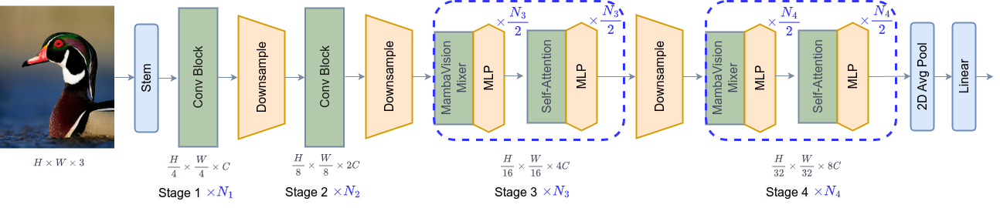

##### Дизайн MambaVision Mixer

Как показано ниже, мы переработали исходный Mamba-миксер, чтобы сделать его более подходящим для задач компьютерного зрения.
Во-первых, мы предлагаем заменить каузальную свёртку на обычную свёртку, поскольку каузальность ограничивает влияние только одним направлением, что для vision-задач излишне и создаёт ненужные ограничения.

Кроме того, мы добавили симметричную ветку без SSM, состоящую из дополнительной свёртки и активации SiLU (Sigmoid Linear Unit), чтобы компенсировать потерю контента, возникающую из-за последовательных ограничений в SSM.

Затем мы конкатенируем выходы обеих веток и пропускаем их через финальный линейный слой. Такая комбинация гарантирует, что итоговое представление признаков включает в себя как последовательную информацию, так и пространственную, эффективно используя сильные стороны каждой ветки.

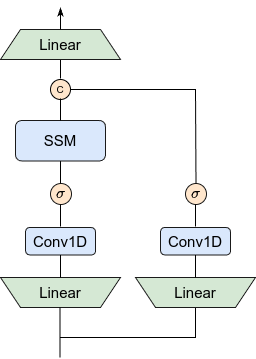

#### Бенчмарки ImageNet-1K

Мы демонстрируем новую передовую (SOTA) Парето-границу в терминах Top-1 точности на ImageNet и пропускной способности для MambaVision. Это означает, что нашу модель можно использовать в различных реальных приложениях с разными ограничениями.

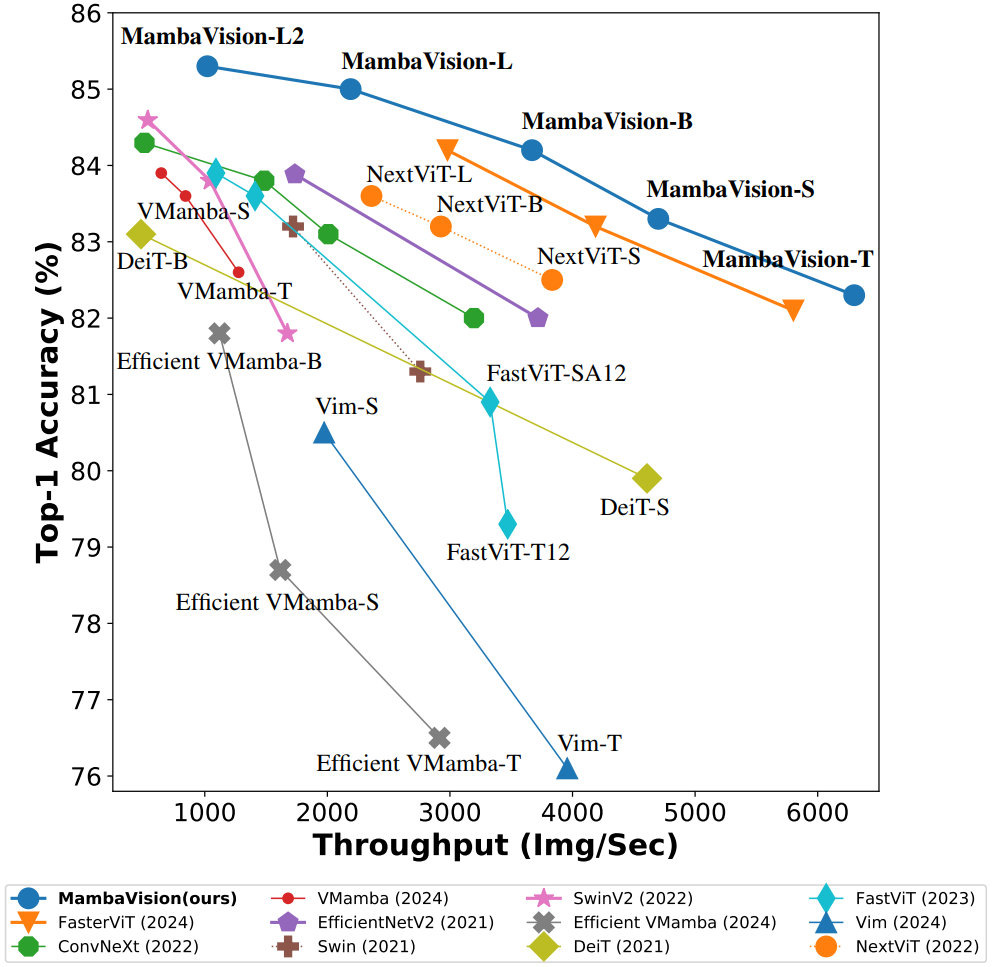

##### Масштабируемость

MambaVision — это первый vision-бэкенд на основе Mamba, которому удалось масштабировать обучение до крупного датасета ImageNet-21K при значительно больших размерах моделей.
Наша самая крупная модель, MambaVision-L3-512-21K, достигает 88.1% Top-1 accuracy при размере 740 млн параметров.

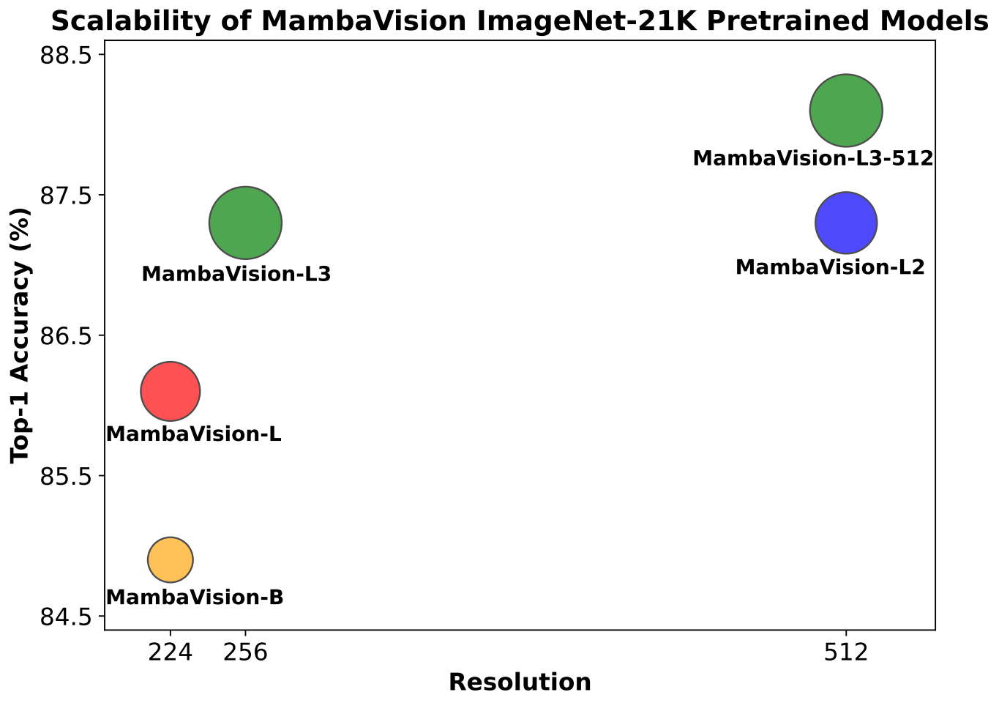

##### Запуск модели

Следующий фрагмент кода скачивает модель и загружает веса. Таблица ниже содержит варианты моделей их разрешение и наборы данных предобучения:

<table>
  <tr>
    <th>Name</th>
    <th>Acc@1(%)</th>
    <th>Acc@5(%)</th>
    <th>#Params(M)</th>
    <th>FLOPs(G)</th>
    <th>Resolution</th>
    <th>Pretraining Dataset</th>
    <th>HF</th>
    <th>Download</th>
  </tr>


<tr>
    <td>MambaVision-L3-512-21K</td>
    <td>88.1</td>
    <td>98.6</td>
    <td>739.6</td>
    <td>489.1</td>
    <td>512x512</td>
    <td>ImageNet-21K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L3-512-21K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L3-512-21K/resolve/main/mambavision_L3_21k_740m_512.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-L3-256-21K</td>
    <td>87.3</td>
    <td>98.3</td>
    <td>739.6</td>
    <td>122.3</td>
    <td>256x256</td>
    <td>ImageNet-21K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L3-256-21K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L3-256-21K/resolve/main/mambavision_L3_21k_740m_256.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-L2-512-21K</td>
    <td>87.3</td>
    <td>98.4</td>
    <td>241.5</td>
    <td>196.3</td>
    <td>512x512</td>
    <td>ImageNet-21K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L2-512-21K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L2-512-21K/resolve/main/mambavision_L2_21k_240m_512.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-L-21K</td>
    <td>86.1</td>
    <td>97.9</td>
    <td>227.9</td>
    <td>34.9</td>
    <td>224x224</td>
    <td>ImageNet-21K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L-21K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L-21K/resolve/main/mambavision_large_21k.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-L2</td>
    <td>85.3</td>
    <td>97.2</td>
    <td>241.5</td>
    <td>37.5</td>
    <td>224x224</td>
    <td>ImageNet-1K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L2-1K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L2-1K/resolve/main/mambavision_large2_1k.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-L</td>
    <td>85.0</td>
    <td>97.1</td>
    <td>227.9</td>
    <td>34.9</td>
    <td>224x224</td>
    <td>ImageNet-1K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L-1K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-L-1K/resolve/main/mambavision_large_1k.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-B-21K</td>
    <td>84.9</td>
    <td>97.5</td>
    <td>97.7</td>
    <td>15.0</td>
    <td>224x224</td>
    <td>ImageNet-21K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-B-21K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-B-21K/resolve/main/mambavision_base_21k.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-B</td>
    <td>84.2</td>
    <td>96.9</td>
    <td>97.7</td>
    <td>15.0</td>
    <td>224x224</td>
    <td>ImageNet-1K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-B-1K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-B-1K/resolve/main/mambavision_base_1k.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-S</td>
    <td>83.3</td>
    <td>96.5</td>
    <td>50.1</td>
    <td>7.5</td>
    <td>224x224</td>
    <td>ImageNet-1K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-S-1K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-S-1K/resolve/main/mambavision_small_1k.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-T2</td>
    <td>82.7</td>
    <td>96.3</td>
    <td>35.1</td>
    <td>5.1</td>
    <td>224x224</td>
    <td>ImageNet-1K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-T2-1K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-T2-1K/resolve/main/mambavision_tiny2_1k.pth.tar">model</a></td>
</tr>

<tr>
    <td>MambaVision-T</td>
    <td>82.3</td>
    <td>96.2</td>
    <td>31.8</td>
    <td>4.4</td>
    <td>224x224</td>
    <td>ImageNet-1K</td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-T-1K">link</a></td>
    <td><a href="https://huggingface.co/nvidia/MambaVision-T-1K/resolve/main/mambavision_tiny_1k.pth.tar">model</a></td>
</tr>

</table>

In [ ]:
from transformers import AutoModelForImageClassification
from timm.data.transforms_factory import create_transform
from PIL import Image

import requests

model_name = "nvidia/MambaVision-B-21K" # select any models you would like from the table above
resolution = 224 # remember to choose the resolution based on the corresponding model for optimal results (although it would still work with any resolution)

model = AutoModelForImageClassification.from_pretrained(model_name, trust_remote_code=True)

# eval mode for inference
model.cuda().eval()

print("MambaVision model loaded succesfully ✅")

# prepare image for the model
url = 'http://images.cocodataset.org/val2017/000000020247.jpg'
image = Image.open(requests.get(url, stream=True).raw)
input_resolution = (3, resolution, resolution)  # MambaVision supports any input resolutions

transform = create_transform(input_size=input_resolution,
                             is_training=False,
                             mean=model.config.mean,
                             std=model.config.std,
                             crop_mode=model.config.crop_mode,
                             crop_pct=model.config.crop_pct)

inputs = transform(image).unsqueeze(0).cuda()
# model inference
outputs = model(inputs)
logits = outputs['logits']
predicted_class_idx = logits.argmax(-1).item()
print('################# Inference Result:#################')
print("Predicted class:", model.config.id2label[predicted_class_idx])